In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

## Device 2 - Test 1

In [3]:
d2_20 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d2-1_TEST1-20 mM.xls")
d2_40 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d2-1_TEST1-40 mM.xls")
d2_80 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d2-1_TEST1-80 mM.xls")
d2_160 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d2-1_TEST1-160 mM.xls")

WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
WARNING *** file size (416194) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
WARNING *** file size (416118) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


In [4]:
d2_20

,Time,DrainI,DrainV,GateI,GateV,DIFFV
0,0.035593,0.000000e+00,0.001833,0.000000e+00,0.689852,0.688019
1,0.138106,6.000000e-09,0.501198,6.000000e-09,0.879161,0.377963
2,0.241110,1.200000e-08,0.982388,1.200000e-08,0.976983,-0.005405
3,0.344108,1.800000e-08,1.051429,1.800000e-08,1.041930,-0.009499
4,0.447105,2.400000e-08,1.101501,2.400000e-08,1.094091,-0.007409
...,...,...,...,...,...,...
3115,320.922974,0.000000e+00,-0.189955,0.000000e+00,0.507852,0.697807
3116,321.026001,0.000000e+00,-0.193098,0.000000e+00,0.508474,0.701572
3117,321.128967,0.000000e+00,-0.196248,0.000000e+00,0.508855,0.705103
3118,321.231964,0.000000e+00,-0.199446,0.000000e+00,0.509269,0.708716


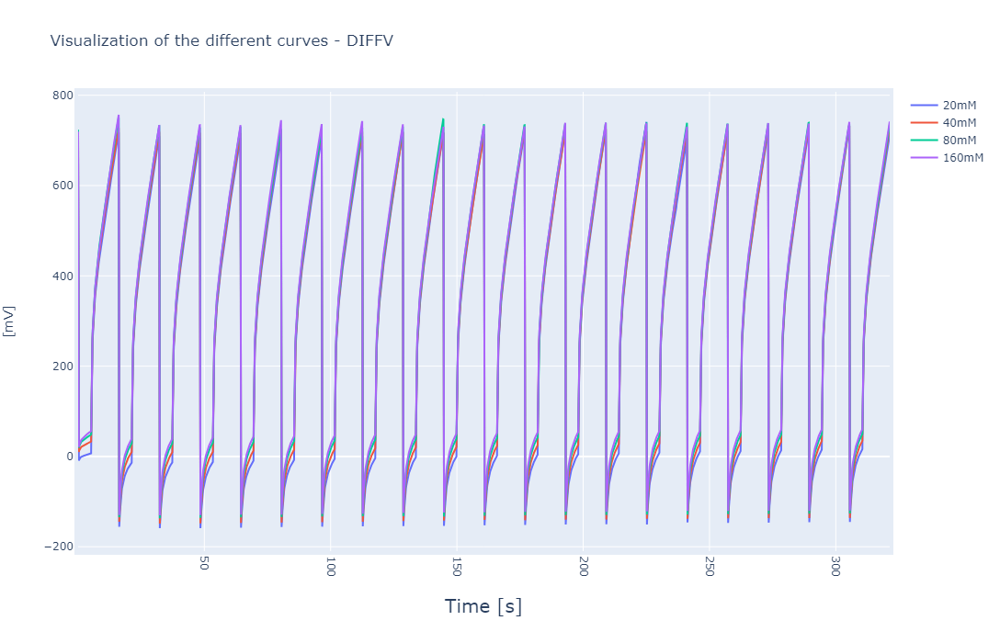

In [5]:
fig = go.Figure()

fig.add_traces([go.Scatter(x=d2_20['Time'], y=d2_20['DIFFV']*1000, name = "20mM"),
                go.Scatter(x=d2_40['Time'], y=d2_40['DIFFV']*1000, name = "40mM"),
                go.Scatter(x=d2_80['Time'], y=d2_80['DIFFV']*1000, name = "80mM"),
                go.Scatter(x=d2_160['Time'],y =d2_160['DIFFV']*1000, name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1200,
    height=700,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Visualization of the different curves - DIFFV'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

In [6]:
diff = pd.DataFrame(data = {'Time': d2_20['Time'],'20mM': d2_20['DIFFV'],'40mM': d2_40['DIFFV'],'80mM': d2_80['DIFFV'],'160mM': d2_160['DIFFV']})
gatev = pd.DataFrame(data = {'Time': d2_20['Time'],'20mM': d2_20['GateV'],'40mM': d2_40['GateV'],'80mM': d2_80['GateV'],'160mM': d2_160['GateV']})
drainv = pd.DataFrame(data = {'Time': d2_20['Time'],'20mM': d2_20['DrainV'],'40mM': d2_40['DrainV'],'80mM': d2_80['DrainV'],'160mM': d2_160['DrainV']})

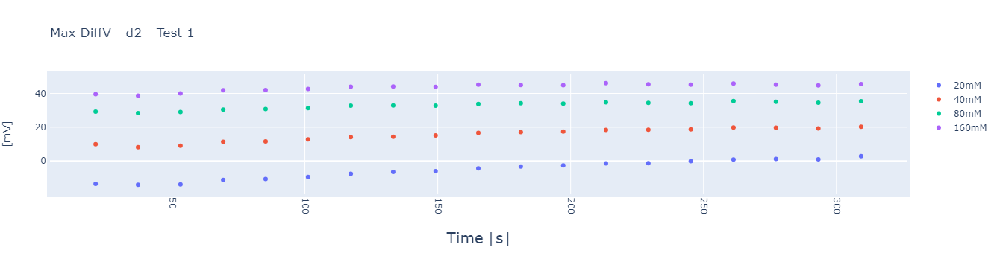

<Figure size 936x432 with 0 Axes>

In [31]:
plt.figure(figsize=(13,6))
fig = go.Figure()
x = diff[round((diff['Time']-5.18)%16,2)<=0.2].iloc[2::2]*1000
x['Time'] = diff[round((diff['Time']-5.18)%16,2)<=0.2].iloc[2::2]['Time']
fig.add_traces([go.Scatter(x=x['Time'], y=x['20mM'], mode='markers',name = "20mM"),
                go.Scatter(x=x['Time'], y=x['40mM'],mode='markers', name = "40mM"),
                go.Scatter(x=x['Time'], y=x['80mM'], mode='markers',name = "80mM"),
                go.Scatter(x=x['Time'],y =x['160mM'],mode='markers', name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=300,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Max DiffV - d2 - Test 1'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
plt.savefig(r'C:\Users\Desi\Desktop\TesiStanford\Nasensing\MaxDiffVAcrossConcentrations.png')
fig.show()

In [8]:
diff_last5 = diff[diff['Time'] > 240]

In [9]:
max_last5 = diff_last5[round(diff_last5['Time']%16,2)<=0.2].drop(columns = 'Time')
max_last5_2 = diff_last5[round((diff_last5['Time']-5.18)%16,2)<=0.2].drop(columns = 'Time')
max_last5

,20mM,40mM,80mM,160mM
2330,0.671364,0.691081,0.706007,0.698901
2331,0.675055,0.694685,0.709631,0.702577
2485,0.683788,0.686051,0.699631,0.700433
2486,0.687546,0.689470,0.703182,0.703984
2641,0.684515,0.689792,0.701259,0.702398
2642,0.688227,0.693441,0.704742,0.706000
2796,0.681714,0.689848,0.697741,0.697180
2797,0.685405,0.693520,0.701634,0.700880
2951,0.675682,0.688028,0.691378,0.696667
2952,0.679352,0.691857,0.695127,0.700530


In [10]:
max_last5_diff = max_last5.diff(axis = 1).rename(columns={"40mM": "40-20 mM", "80mM": "80-40 mM", "160mM": "160-80 mM"}).dropna(axis = 1)*1000
max_last5_diff

,40-20 mM,80-40 mM,160-80 mM
2330,19.717172,14.925644,-7.105589
2331,19.629344,14.946133,-7.053688
2485,2.263024,13.580158,0.802383
2486,1.923770,13.712123,0.802785
2641,5.276844,11.466712,1.139536
2642,5.214393,11.301145,1.257673
2796,8.134156,7.892564,-0.560269
2797,8.114547,8.114323,-0.754341
2951,12.346357,3.349736,5.288973
2952,12.504444,3.270164,5.403727


In [11]:
max_last5.mean()

20mM     0.679727
40mM     0.689763
80mM     0.699790
160mM    0.700807
dtype: float64

In [12]:
(max_last5.mean()-max_last5.mean()[0])*1000

20mM      0.000000
40mM     10.035897
80mM     20.063359
160mM    21.080224
dtype: float64

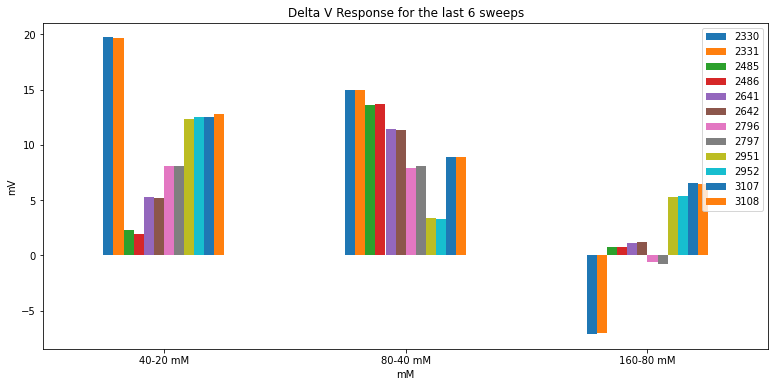

In [13]:
ax = max_last5_diff.transpose().plot.bar(rot=0, title = 'Delta V Response for the last 6 sweeps', ylabel = 'mV', xlabel = 'mM', figsize = (13,6))

In [14]:
mean_std_last5 = pd.DataFrame(max_last5_diff.mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_last5['std [mV]'] = max_last5_diff.std()
mean_std_last5

,Mean [mV],std [mV]
40-20 mM,10.035897,5.957123
80-40 mM,10.027462,4.035723
160-80 mM,1.016865,4.615390


In [15]:
# response across the whole test

max_total = (diff[round(diff['Time']%16,2)<=0.2].drop(columns = 'Time')*1000).iloc[8:, :]
max_total_diff = max_total.diff(axis = 1).rename(columns={"40mM": "40-20 mM", "80mM": "80-40 mM", "160mM": "160-80 mM"}).dropna(axis = 1)

In [16]:
max_total.mean()

20mM     692.473078
40mM     698.540890
80mM     710.597976
160mM    712.918218
dtype: float64

In [17]:
(max_total.mean()-max_total.mean()[0])

20mM      0.000000
40mM      6.067812
80mM     18.124897
160mM    20.445140
dtype: float64

In [18]:
plt.figure(figsize=(13,6))
sns.set_theme(style="ticks", palette="pastel")

sns.boxplot(data=max_total_diff).set(ylabel = 'mV', title = 'Delta V Response for the last 6 sweeps')
sns.despine(offset=10, trim=True)


NameError: name 'sns' is not defined

<Figure size 936x432 with 0 Axes>

In [19]:
mean_std = pd.DataFrame(max_total_diff.mean()).rename(columns = {0: 'Mean [mV]'})
mean_std['std [mV]'] = max_total_diff.std()
mean_std

,Mean [mV],std [mV]
40-20 mM,6.067812,9.542745
80-40 mM,12.057086,6.875965
160-80 mM,2.320242,8.189324


In [20]:
mean_std_2 = pd.DataFrame((max_total - max_total.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_2['std [mV]'] = (max_total - max_total.mean()[0]).std()
mean_std_2

,Mean [mV],std [mV]
20mM,-1.337492e-14,11.205259
40mM,6.067812e+00,9.135075
80mM,1.812490e+01,10.082035
160mM,2.044514e+01,12.108654


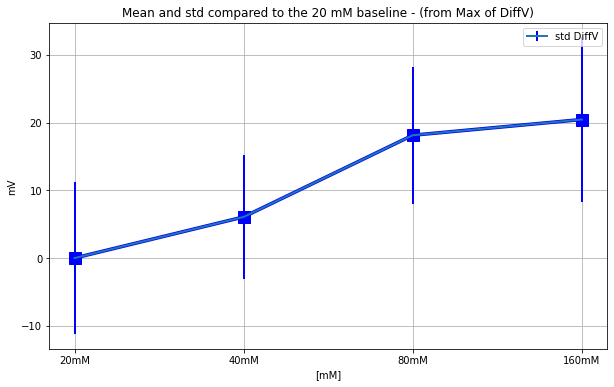

In [21]:
fig, ax = plt.subplots(figsize = (10,6))

ax.errorbar(mean_std_2.index, mean_std_2['Mean [mV]'], mean_std_2['std [mV]'], label = 'std DiffV',linewidth=2, ecolor = 'blue')
plt.plot(mean_std_2.index,mean_std_2['Mean [mV]'], marker='s', mfc='blue',linewidth=3.5, markersize=12, color = 'blue')
ax.set_ylabel('mV')
ax.set_xlabel('[mM]')
ax.set_title('Mean and std compared to the 20 mM baseline - (from Max of DiffV)')
plt.legend()
plt.grid()

## Redoing the precedent graphs but not taking the maximum of the DIFFV, but the maximum of the gate/drain (points where the difference in [] is higher)

In [32]:
x = x[x['Time']>220]
x = x.drop(columns = 'Time')
mean_std_x = pd.DataFrame((x - x.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_x['std [mV]'] = (x - x.mean()[0]).std()
mean_std_x.to_csv(r'C:\Users\Desi\Desktop\TesiStanford\NaOFET\mean_std_DiffV.csv', encoding='utf-8',sep=',', float_format='%.4f')
mean_std_x

,Mean [mV],std [mV]
20mM,0.000000,1.428352
40mM,18.645346,0.663950
80mM,34.049034,0.549371
160mM,44.531524,0.350872


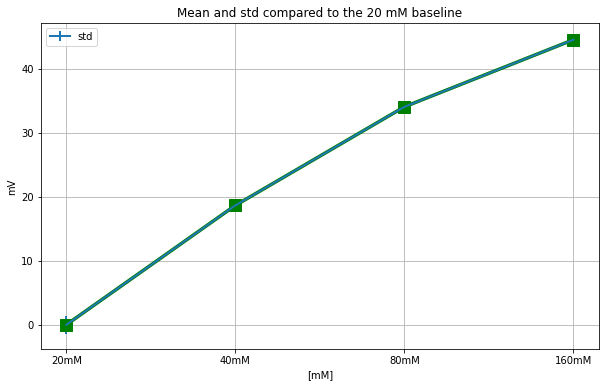

In [26]:
fig, ax = plt.subplots(figsize = (10,6))

ax.errorbar(mean_std_x.index, mean_std_x['Mean [mV]'], mean_std_x['std [mV]'], label = 'std',linewidth=2)
plt.plot(mean_std_x.index,mean_std_x['Mean [mV]'], marker='s', mfc='green',linewidth=3.5, markersize=12, color = 'green')
ax.set_ylabel('mV')
ax.set_xlabel('[mM]')
ax.set_title('Mean and std compared to the 20 mM baseline')
plt.legend()
plt.grid()
plt.savefig(r'C:\Users\Desi\Desktop\TesiStanford\Nasensing\Mean_std.png')

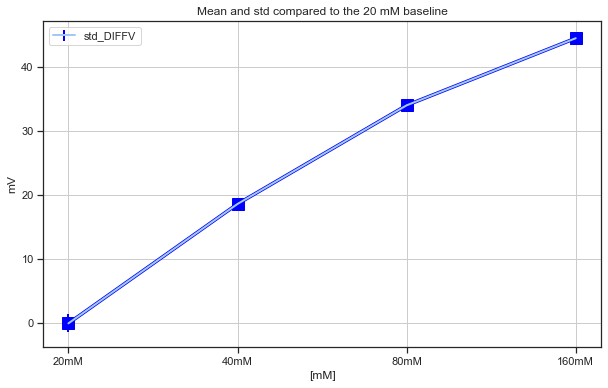

In [508]:
fig, ax = plt.subplots(figsize = (10,6))

ax.errorbar(mean_std_x.index, mean_std_x['Mean [mV]'], mean_std_x['std [mV]'], label = 'std_DIFFV',linewidth=2, ecolor = "blue")
plt.plot(mean_std_x.index,mean_std_x['Mean [mV]'], marker='s', mfc='blue',linewidth=3.5, markersize=12, color = 'blue')

ax.set_ylabel('mV')
ax.set_xlabel('[mM]')
ax.set_title('Mean and std compared to the 20 mM baseline')
plt.legend()
plt.grid()
plt.savefig(r'C:\Users\Desi\Desktop\TesiStanford\Nasensing\Mean_std_last6.png')

## Looking at the Gate V and Drain V behavior

In [381]:
gatev

,Time,20mM,40mM,80mM,160mM
0,0.035593,0.689852,0.715551,0.721329,0.716829
1,0.138106,0.879161,0.898984,0.902794,0.897168
2,0.241110,0.976983,0.993934,0.996508,0.990470
3,0.344108,1.041930,1.057533,1.059463,1.053250
4,0.447105,1.094091,1.108827,1.110400,1.104000
...,...,...,...,...,...
3115,320.922974,0.507852,0.517360,0.525145,0.531928
3116,321.026001,0.508474,0.518026,0.525770,0.532493
3117,321.128967,0.508855,0.518181,0.526595,0.532809
3118,321.231964,0.509269,0.518791,0.526419,0.533320


In [27]:
max_gatev = gatev[round((gatev['Time']-5.18)%16,2)<=0.2].iloc[4::2]
max_drainv = drainv[round((drainv['Time']-5.18)%16,2)<=0.2].iloc[4::2]

In [28]:
max_gatev2 = gatev[round((gatev['Time'])%16,2)<=0.2].iloc[4::2]
max_drainv2 = drainv[round((drainv['Time'])%16,2)<=0.2].iloc[4::2]

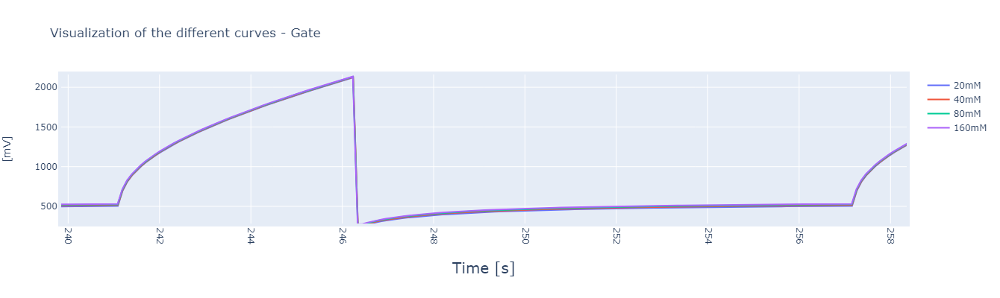

In [456]:
fig = go.Figure()

fig.add_traces([go.Scatter(x=d2_20['Time'], y=d2_20['GateV']*1000, name = "20mM"),
                go.Scatter(x=d2_40['Time'], y=d2_40['GateV']*1000, name = "40mM"),
                go.Scatter(x=d2_80['Time'], y=d2_80['GateV']*1000, name = "80mM"),
                go.Scatter(x=d2_160['Time'],y =d2_160['GateV']*1000, name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=400,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Visualization of the different curves - Gate'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

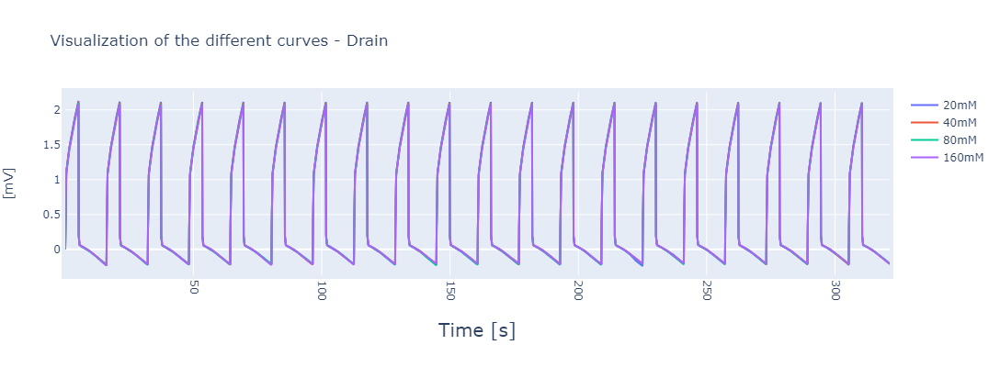

In [394]:
fig = go.Figure()

fig.add_traces([go.Scatter(x=d2_20['Time'], y=d2_20['DrainV'], name = "20mM"),
                go.Scatter(x=d2_40['Time'], y=d2_40['DrainV'], name = "40mM"),
                go.Scatter(x=d2_80['Time'], y=d2_80['DrainV'], name = "80mM"),
                go.Scatter(x=d2_160['Time'],y =d2_160['DrainV'], name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=400,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Visualization of the different curves - Drain'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

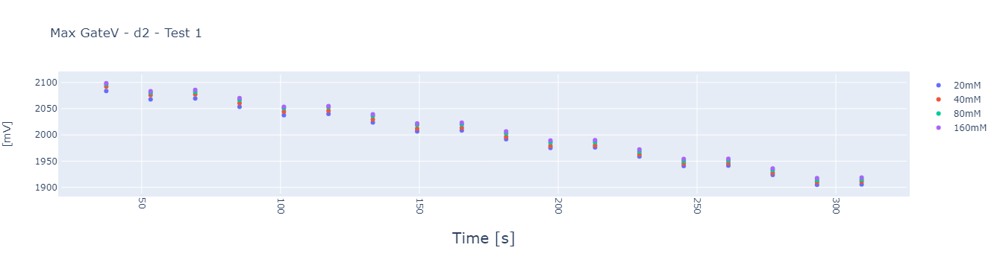

<Figure size 936x432 with 0 Axes>

In [457]:
plt.figure(figsize=(13,6))
fig = go.Figure()

fig.add_traces([go.Scatter(x=max_gatev['Time'], y=max_gatev['20mM']*1000, mode='markers',name = "20mM"),
                go.Scatter(x=max_gatev['Time'], y=max_gatev['40mM']*1000,mode='markers', name = "40mM"),
                go.Scatter(x=max_gatev['Time'], y=max_gatev['80mM']*1000, mode='markers',name = "80mM"),
                go.Scatter(x=max_gatev['Time'],y =max_gatev['160mM']*1000,mode='markers', name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=300,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Max GateV - d2 - Test 1'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

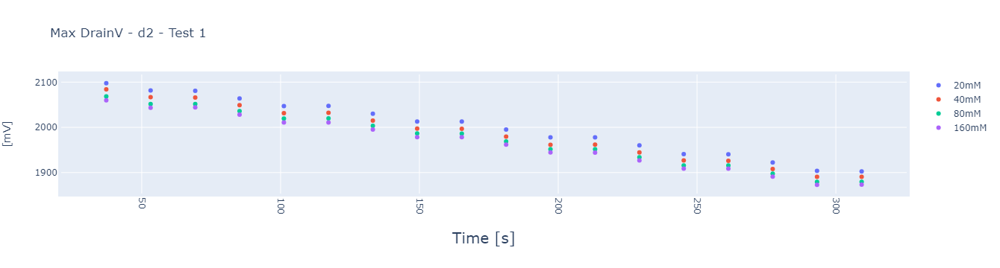

<Figure size 936x432 with 0 Axes>

In [458]:
plt.figure(figsize=(13,6))
fig = go.Figure()

fig.add_traces([go.Scatter(x=max_drainv['Time'], y=max_drainv['20mM']*1000, mode='markers',name = "20mM"),
                go.Scatter(x=max_drainv['Time'], y=max_drainv['40mM']*1000,mode='markers', name = "40mM"),
                go.Scatter(x=max_drainv['Time'], y=max_drainv['80mM']*1000, mode='markers',name = "80mM"),
                go.Scatter(x=max_drainv['Time'],y =max_drainv['160mM']*1000,mode='markers', name = "160mM")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=300,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'Max DrainV - d2 - Test 1'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

In [29]:
max_gatev = max_gatev[max_gatev['Time']>220]
max_gatev = max_gatev.drop(columns = 'Time')*1000
mean_std_max_gatev = pd.DataFrame((max_gatev - max_gatev.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_max_gatev['std [mV]'] = (max_gatev - max_gatev.mean()[0]).std()
mean_std_max_gatev.to_csv(r'C:\Users\Desi\Desktop\TesiStanford\NaOFET\mean_std_GateV.csv', encoding='utf-8',sep=',', float_format='%.4f')

In [30]:
max_drainv = max_drainv[max_drainv['Time']>220]
max_drainv = max_drainv.drop(columns = 'Time')*1000
mean_std_max_drainv = pd.DataFrame((max_drainv - max_drainv.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_max_drainv['std [mV]'] = (max_drainv - max_drainv.mean()[0]).std()
mean_std_max_drainv.to_csv(r'C:\Users\Desi\Desktop\TesiStanford\NaOFET\mean_std_DrainV.csv', encoding='utf-8',sep=',', float_format='%.4f')
mean_std_max_drainv

,Mean [mV],std [mV]
20mM,7.579123e-14,22.820160
40mM,-1.402469e+01,21.755325
80mM,-2.479742e+01,21.944559
160mM,-3.141860e+01,21.672543


In [499]:
max_drainv2 = max_drainv2[max_drainv2['Time']>220]
max_drainv2 = max_drainv2.drop(columns = 'Time')*1000
mean_std_max_drainv2 = pd.DataFrame((max_drainv2 - max_drainv2.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_max_drainv2['std [mV]'] = (max_drainv2 - max_drainv2.mean()[0]).std()
mean_std_max_drainv2


,Mean [mV],std [mV]
20mM,-8.120488e-15,15.492444
40mM,4.937883e+00,3.827119
80mM,2.255212e+00,7.414010
160mM,8.030723e+00,4.526579


In [500]:
max_gatev2 = max_gatev2[max_gatev2['Time']>220]
max_gatev2 = max_gatev2.drop(columns = 'Time')*1000
mean_std_max_gatev2 = pd.DataFrame((max_gatev2 - max_gatev2.mean()[0]).mean()).rename(columns = {0: 'Mean [mV]'})
mean_std_max_gatev2['std [mV]'] = (max_gatev2 - max_gatev2.mean()[0]).std()
mean_std_max_gatev2

,Mean [mV],std [mV]
20mM,8.120488e-15,1.930465
40mM,1.037083e+01,1.318019
80mM,1.881542e+01,1.092610
160mM,2.547443e+01,0.921422


## Comparison between GateV, DrainV, DiffV

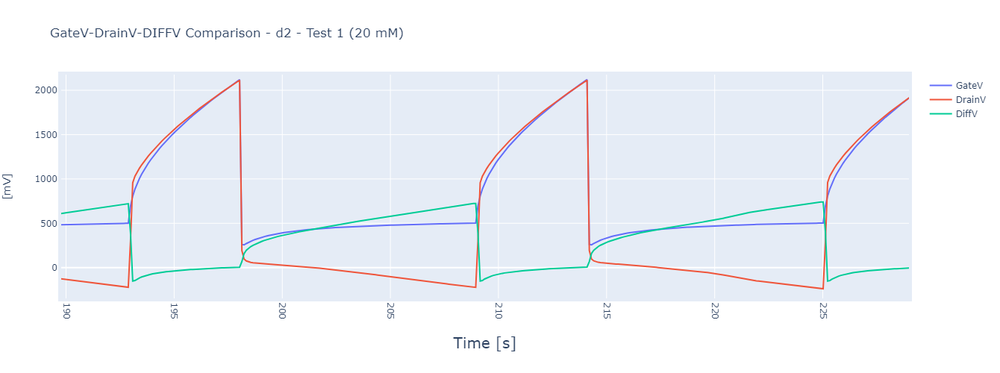

<Figure size 936x432 with 0 Axes>

In [488]:
plt.figure(figsize=(13,6))
fig = go.Figure()

fig.add_traces([go.Scatter(x=d2_20['Time'], y=d2_20['GateV']*1000,name = "GateV"),
                go.Scatter(x=d2_20['Time'], y=d2_20['DrainV']*1000, name = "DrainV"),
                go.Scatter(x=d2_20['Time'], y=d2_20['DIFFV']*1000,name = "DiffV")])

fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    title = 'GateV-DrainV-DIFFV Comparison - d2 - Test 1 (20 mM)'
)
fig.update_xaxes(
        tickangle = 90,
        title_text = "Time [s]",
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "[mV]",
        title_standoff = 25)
fig.show()

## Device 1 - Test 2

In [136]:
d1 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d1-1_TEST2.xls")

WARNING *** file size (535712) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


In [460]:
time = d1['Time']
d1 = d1*100
d1['Time'] = time

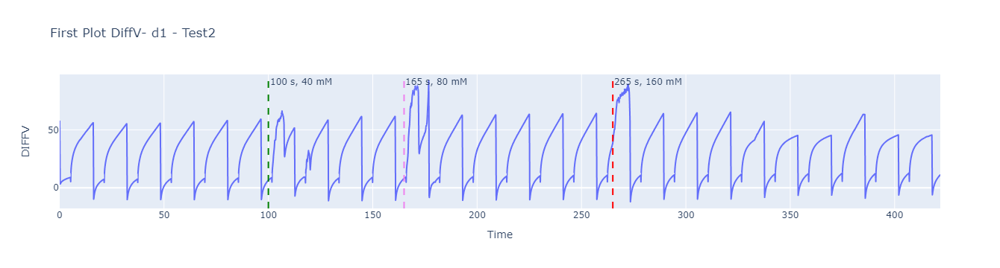

In [472]:
fig = px.line(d1, x="Time", y="DIFFV", title='First Plot DiffV- d1 - Test2', hover_data = ['Time'])
fig.add_vline(x = 100,  annotation_text = '100 s, 40 mM',line_dash="dash", line_color="green")
fig.add_vline(x = 165,  annotation_text = '165 s, 80 mM',line_dash="dash", line_color="violet")
fig.add_vline(x = 265,  annotation_text = '265 s, 160 mM',  line_dash="dash", line_color="red")
fig.show()

In [430]:
max_total_d1 = (d1[round((d1['Time']-5.18)%16,2)<=0.2].drop(columns = 'Time')*1000).iloc[4::2,:]
max_total_d1['Time'] = d1['Time']

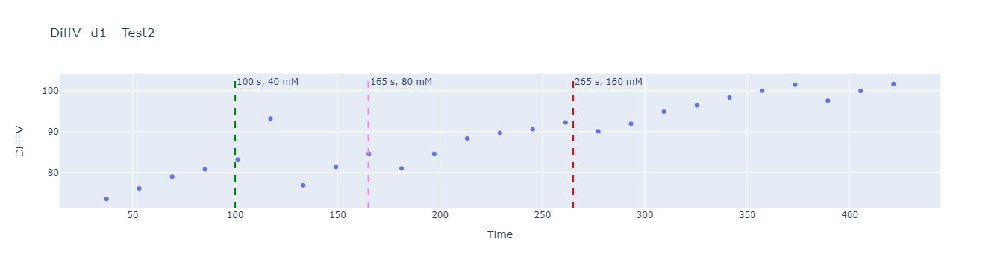

In [473]:
fig = px.scatter(max_total_d1, x="Time", y="DIFFV", title='DiffV- d1 - Test2', hover_data = ['Time'])
fig.add_vline(x = 100,  annotation_text = '100 s, 40 mM',line_dash="dash", line_color="green")
fig.add_vline(x = 165,  annotation_text = '165 s, 80 mM',line_dash="dash", line_color="violet")
fig.add_vline(x = 265,  annotation_text = '265 s, 160 mM',  line_dash="dash", line_color="red")
fig.show()

In [474]:
max_20_d1 = max_total_d1[max_total_d1['Time']<100]
max_40_d1 = max_total_d1[(max_total_d1['Time']>=100) & (max_total_d1['Time']<165)]
max_80_d1 = max_total_d1[(max_total_d1['Time']>=165) & (max_total_d1['Time']<265)]
max_160_d1 = max_total_d1[max_total_d1['Time']>=265]

In [475]:
max_mean_d1 = pd.DataFrame(data =  {'20 mM': max_20_d1['DIFFV'].mean(), '40 mM': max_40_d1['DIFFV'].mean(), '80 mM': max_80_d1['DIFFV'].mean(), '160 mM': max_160_d1['DIFFV'].mean()}, index = ['Mean [mV]']).transpose()

In [476]:
max_mean_d1['std [mV]'] = [(max_20_d1['DIFFV']-max_20_d1['DIFFV'].mean()).std(),(max_40_d1['DIFFV']-max_20_d1['DIFFV'].mean()).std(),(max_80_d1['DIFFV']-max_20_d1['DIFFV'].mean()).std(),(max_160_d1['DIFFV']-max_20_d1['DIFFV'].mean()).std()]

In [477]:
max_mean_d1['Mean [mV]'] = max_mean_d1['Mean [mV]']-max_mean_d1['Mean [mV]'].iloc[0]
max_mean_d1

,Mean [mV],std [mV]
20 mM,0.000000,3.172516
40 mM,6.285727,6.863997
80 mM,9.921389,3.990347
160 mM,19.843233,3.925982


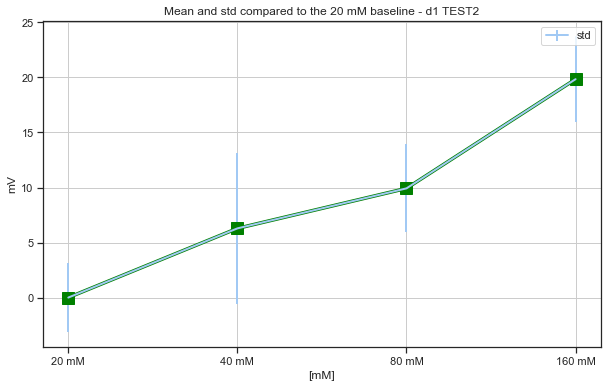

In [478]:
fig, ax = plt.subplots(figsize = (10,6))

ax.errorbar(max_mean_d1.index, max_mean_d1['Mean [mV]'], max_mean_d1['std [mV]'], label = 'std',linewidth=2)
plt.plot(max_mean_d1.index,max_mean_d1['Mean [mV]'], marker='s', mfc='green',linewidth=3.5, markersize=12, color = 'green')
ax.set_ylabel('mV')
ax.set_xlabel('[mM]')
ax.set_title('Mean and std compared to the 20 mM baseline - d1 TEST2')
plt.legend()
plt.grid()

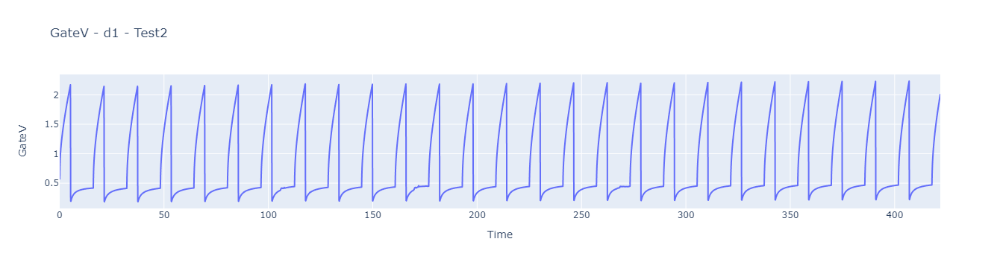

In [414]:
fig = px.line(d1, x="Time", y="GateV", title='GateV - d1 - Test2', hover_data = ['Time'])
fig.show()

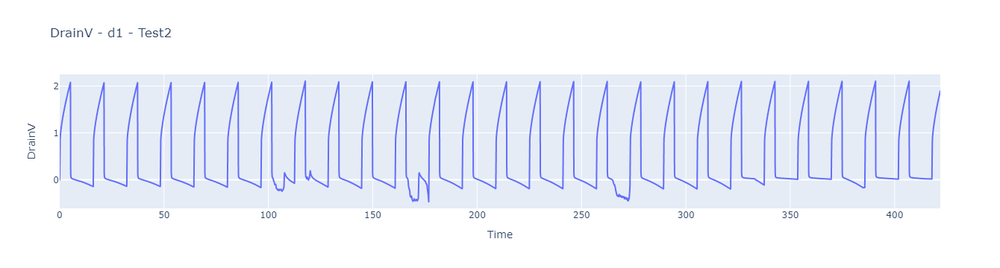

In [326]:
fig = px.line(d1, x="Time", y="DrainV", title='DrainV - d1 - Test2', hover_data = ['Time'])
fig.show()

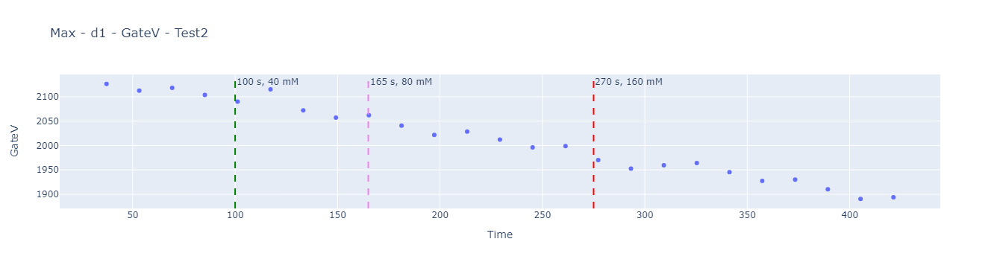

In [468]:
fig = px.scatter(max_total_d1, x="Time", y="GateV", title='Max - d1 - GateV - Test2', hover_data = ['Time'])
fig.add_vline(x = 100,  annotation_text = '100 s, 40 mM',line_dash="dash", line_color="green")
fig.add_vline(x = 165,  annotation_text = '165 s, 80 mM',line_dash="dash", line_color="violet")
fig.add_vline(x = 275,  annotation_text = '270 s, 160 mM',  line_dash="dash", line_color="red")
fig.show()

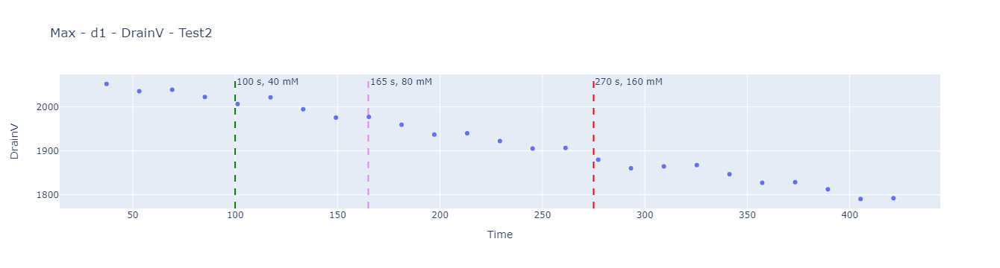

In [469]:
fig = px.scatter(max_total_d1, x="Time", y="DrainV", title='Max - d1 - DrainV - Test2', hover_data = ['Time'])
fig.add_vline(x = 100,  annotation_text = '100 s, 40 mM',line_dash="dash", line_color="green")
fig.add_vline(x = 165,  annotation_text = '165 s, 80 mM',line_dash="dash", line_color="violet")
fig.add_vline(x = 275,  annotation_text = '270 s, 160 mM',  line_dash="dash", line_color="red")
fig.show()

## Device 1 - TEST 1

In [313]:
d1_TEST1 = pd.read_excel(r"C:\Users\Desi\Desktop\TesiStanford\10122023-Na-OFET diode\10122023-d1-1_TEST1.xls")

WARNING *** file size (537082) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


In [314]:
d1_TEST1

,Time,DrainI,DrainV,GateI,GateV,DIFFV
0,0.035731,0.000000e+00,0.008081,0.000000e+00,0.573299,0.565217
1,0.138227,6.000000e-09,0.448911,6.000000e-09,0.763131,0.314220
2,0.241231,1.200000e-08,0.817992,1.200000e-08,0.875108,0.057116
3,0.344216,1.800000e-08,0.897122,1.800000e-08,0.949855,0.052733
4,0.447225,2.400000e-08,0.956092,2.400000e-08,1.010767,0.054675
...,...,...,...,...,...,...
867,89.345490,0.000000e+00,-0.017743,0.000000e+00,0.403051,0.420794
868,89.448486,0.000000e+00,-0.019699,0.000000e+00,0.404443,0.424142
869,89.551498,0.000000e+00,-0.021792,0.000000e+00,0.405939,0.427731
870,89.654488,0.000000e+00,-0.023740,0.000000e+00,0.407241,0.430981


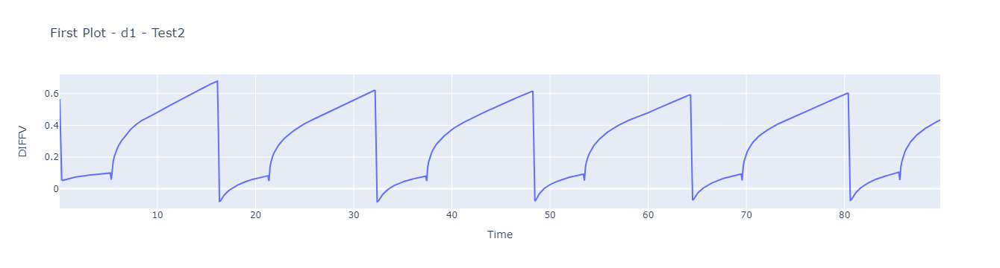

In [316]:
import plotly.express as px
fig = px.line(d1_TEST1, x="Time", y="DIFFV", title='First Plot - d1 - Test2', hover_data = ['Time'])
fig.show()